In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error as mape,mean_absolute_error as mae
from keras import optimizers

# Prepare Data

In [3]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [4]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [5]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [6]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [9]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [10]:
def compare_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [11]:
def error(error1,error2,error3,error4):
    error = pd.DataFrame(columns=['MSE', 'RMSE', 'MAE', 'MAPE'])
    error = [{'MSE' : error1,'RMSE':error2,'MAE':error3,'MAPE':error4}] 
    return error

# Train/Test Model

In [12]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [13]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [14]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [15]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,15)

X_train Shape : (12033, 15, 1)
y_train Shape : (12033, 1)
X_test Shape :  (3013, 15, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [16]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [17]:
test1 = test.copy()

In [18]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 12ms/step - loss: 0.0111 - val_loss: 0.0041
Epoch 2/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0026 - val_loss: 0.0034
Epoch 3/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0021 - val_loss: 0.0032
Epoch 4/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0018 - val_loss: 0.0027
Epoch 5/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 6/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 10/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0

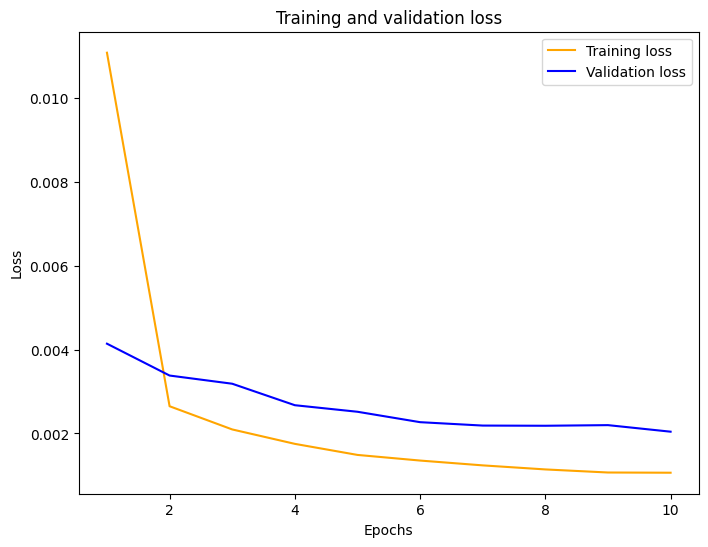

In [19]:
plot_curve(hist_adam)

In [20]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-10 15:24:00,0.538,0.547199
1,2021-12-10 15:25:00,0.588,0.530893
2,2021-12-10 15:26:00,0.566,0.573765
3,2021-12-10 15:27:00,0.562,0.566146
4,2021-12-10 15:28:00,0.612,0.557275
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.162798
3009,2021-12-16 13:59:00,0.169,0.162381
3010,2021-12-16 14:00:00,0.147,0.162983
3011,2021-12-16 14:01:00,0.145,0.147580


In [21]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [22]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_rmse_error = mean_squared_error(test1["cloud_cover"], test1["LSTM_adam"], squared=False)
lstm_mae_error = mae(test1["cloud_cover"], test1["LSTM_adam"])
lstm_mape_error = mape(test1['cloud_cover'], test1['LSTM_adam'])
error(lstm_mse_error_unit_50_adam,lstm_rmse_error,lstm_mae_error,lstm_mape_error)


[{'MSE': 0.002030648691798914,
  'RMSE': 0.045062719533988556,
  'MAE': 0.02196343762814069,
  'MAPE': 0.08601468433417768}]

In [23]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'Frist layer', 'Drop out', 'Second layer', 'Drop out2', 'Third layer', 
                                 'Output layer', 'Epochs', 'MAE error', 'MAPE error','MSE error', 'RMSE error'])

data = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error, 'MAPE error' : lstm_mape_error,'MSE error':lstm_mse_error_unit_50_adam, 'RMSE error':lstm_rmse_error} ]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\848098917.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [24]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 10ms/step - loss: 0.0049 - val_loss: 0.0031
Epoch 2/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0017 - val_loss: 0.0025
Epoch 3/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0013 - val_loss: 0.0037
Epoch 4/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0028
Epoch 5/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0028
Epoch 6/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0033
Epoch 9/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.002

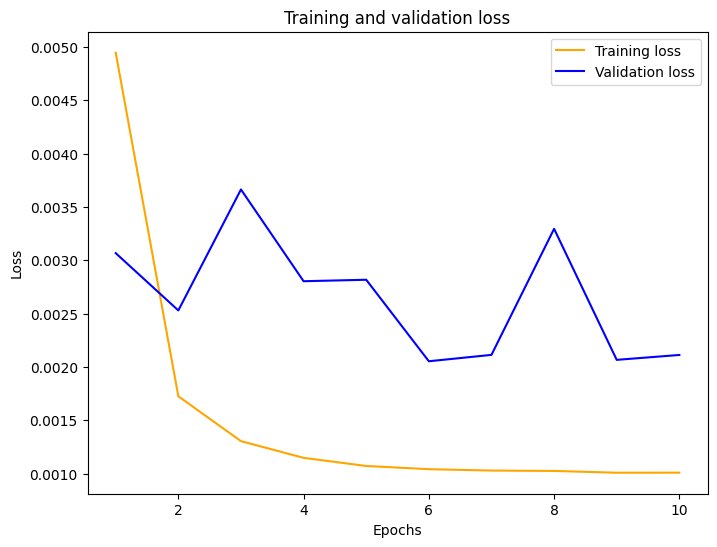

In [25]:
plot_curve(hist_50_rms)

In [26]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.547199,0.543693
1,2021-12-10 15:25:00,0.588,0.530893,0.527746
2,2021-12-10 15:26:00,0.566,0.573765,0.581436
3,2021-12-10 15:27:00,0.562,0.566146,0.558293
4,2021-12-10 15:28:00,0.612,0.557275,0.553659
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.162798,0.158817
3009,2021-12-16 13:59:00,0.169,0.162381,0.158720
3010,2021-12-16 14:00:00,0.147,0.162983,0.159695
3011,2021-12-16 14:01:00,0.145,0.147580,0.138505


In [27]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [28]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
lstm_rmse_error1 = mean_squared_error(test1["cloud_cover"], test1["LSTM_50_rms"], squared=False)
lstm_mae_error1 = mae(test1["cloud_cover"], test1["LSTM_50_rms"])
lstm_mape_error1 = mape(test1['cloud_cover'], test1['LSTM_50_rms'])
error(lstm_mse_error_unit_50_rms,lstm_rmse_error1,lstm_mae_error1,lstm_mape_error1)

[{'MSE': 0.0021018628591217645,
  'RMSE': 0.04584607790336884,
  'MAE': 0.02307331592541026,
  'MAPE': 0.09772725214220995}]

In [29]:
compare_model(lstm_mape_error,lstm_mape_error1)

Better MSE value is :  0.08601468433417768


,Model,MSE error
0,model,0.086015
1,model_1,0.097727


In [30]:
data1 = [{'Lags':15 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error1, 'MAPE error' : lstm_mape_error1,'MSE error':lstm_mse_error_unit_50_rms, 'RMSE error':lstm_rmse_error1}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\809989439.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [31]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
189/189 [==============================] - 6s 15ms/step - loss: 0.0318 - val_loss: 0.0060
Epoch 2/10
189/189 [==============================] - 2s 10ms/step - loss: 0.0046 - val_loss: 0.0051
Epoch 3/10
189/189 [==============================] - 2s 10ms/step - loss: 0.0037 - val_loss: 0.0043
Epoch 4/10
189/189 [==============================] - 2s 10ms/step - loss: 0.0030 - val_loss: 0.0040
Epoch 5/10
189/189 [==============================] - 2s 10ms/step - loss: 0.0026 - val_loss: 0.0036
Epoch 6/10
189/189 [==============================] - 2s 10ms/step - loss: 0.0023 - val_loss: 0.0033
Epoch 7/10
189/189 [==============================] - 2s 10ms/step - loss: 0.0020 - val_loss: 0.0031
Epoch 8/10
189/189 [==============================] - 2s 10ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 9/10
189/189 [==============================] - 2s 10ms/step - loss: 0.0017 - val_loss: 0.0034
Epoch 10/10
189/189 [==============================] - 2s 10ms/step - loss: 0.0015 - val_lo

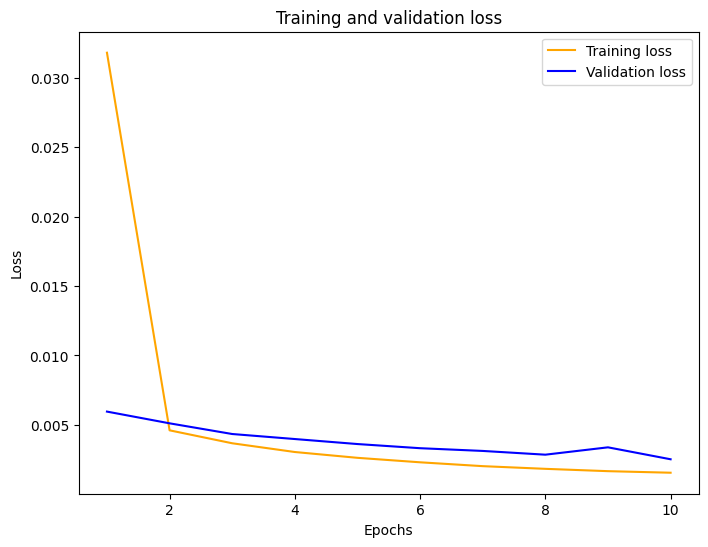

In [32]:
plot_curve(hist_batch_size64)

In [33]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.547199,0.543693,0.581673
1,2021-12-10 15:25:00,0.588,0.530893,0.527746,0.548972
2,2021-12-10 15:26:00,0.566,0.573765,0.581436,0.552673
3,2021-12-10 15:27:00,0.562,0.566146,0.558293,0.559625
4,2021-12-10 15:28:00,0.612,0.557275,0.553659,0.564186
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.162798,0.158817,0.169055
3009,2021-12-16 13:59:00,0.169,0.162381,0.158720,0.168757
3010,2021-12-16 14:00:00,0.147,0.162983,0.159695,0.168983
3011,2021-12-16 14:01:00,0.145,0.147580,0.138505,0.162406


In [34]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [35]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
lstm_rmse_error2 = mean_squared_error(test1["cloud_cover"], test1["LSTM_4_batch_size"], squared=False)
lstm_mae_error2 = mae(test1["cloud_cover"], test1["LSTM_4_batch_size"])
lstm_mape_error2 = mape(test1['cloud_cover'], test1['LSTM_4_batch_size'])
error(lstm_mse_error_batch_size64,lstm_rmse_error2,lstm_mae_error2,lstm_mape_error2)

[{'MSE': 0.0025054432733769886,
  'RMSE': 0.050054403136757,
  'MAE': 0.026015574839058864,
  'MAPE': 0.10098131657255244}]

In [36]:
compare_model(lstm_mape_error,lstm_mape_error2)

Better MSE value is :  0.08601468433417768


,Model,MSE error
0,model,0.086015
1,model_1,0.100981


In [37]:
data2 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error2, 'MAPE error' : lstm_mape_error2,'MSE error':lstm_mse_error_batch_size64
              , 'RMSE error':lstm_rmse_error2}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\3041233710.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054


---

### learning rate 0.1

In [38]:
test2 = test.copy()

#### Add frist layer: units = 50

In [39]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 7s 10ms/step - loss: 0.1156 - val_loss: 0.0022
Epoch 2/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0050
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 4/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 5/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0035
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0015 - val_loss: 0.0171
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0016 - val_loss: 0.0047
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0155
Epoch 9/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0017 - val_loss: 0.0025
Epoch 10/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0014 - val_loss: 0.002

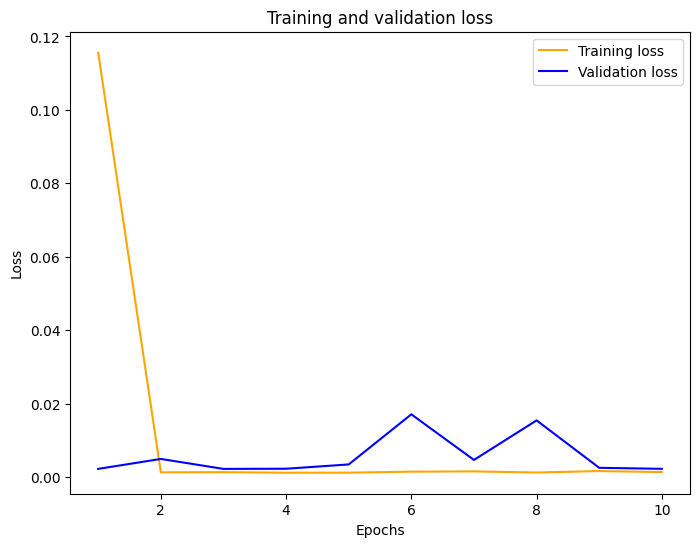

In [40]:
plot_curve(hist_01)

In [41]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.543930
1,2021-12-10 15:25:00,0.588,0.534214
2,2021-12-10 15:26:00,0.566,0.594849
3,2021-12-10 15:27:00,0.562,0.563980
4,2021-12-10 15:28:00,0.612,0.558066
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172794
3009,2021-12-16 13:59:00,0.169,0.173644
3010,2021-12-16 14:00:00,0.147,0.174848
3011,2021-12-16 14:01:00,0.145,0.145481


In [42]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [43]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
lstm_rmse_error3 = mean_squared_error(test2["cloud_cover"], test2["LSTM_01"], squared=False)
lstm_mae_error3 = mae(test2["cloud_cover"], test2["LSTM_01"])
lstm_mape_error3 = mape(test2['cloud_cover'], test2['LSTM_01'])
error(lstm_mse_error_unit_50_01,lstm_rmse_error3,lstm_mae_error3,lstm_mape_error3)

[{'MSE': 0.0022488031135656015,
  'RMSE': 0.04742154693349429,
  'MAE': 0.02361231775837649,
  'MAPE': 0.10614883243039361}]

In [44]:
compare_model(lstm_mape_error,lstm_mape_error3)

Better MSE value is :  0.08601468433417768


,Model,MSE error
0,model,0.086015
1,model_1,0.106149


In [45]:
data3 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error3, 'MAPE error' : lstm_mape_error3,'MSE error':lstm_mse_error_unit_50_01, 'RMSE error':lstm_rmse_error3}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\421229641.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [46]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 7s 9ms/step - loss: 0.0114 - val_loss: 0.0023
Epoch 2/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0026
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 5/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0024
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 10/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0024

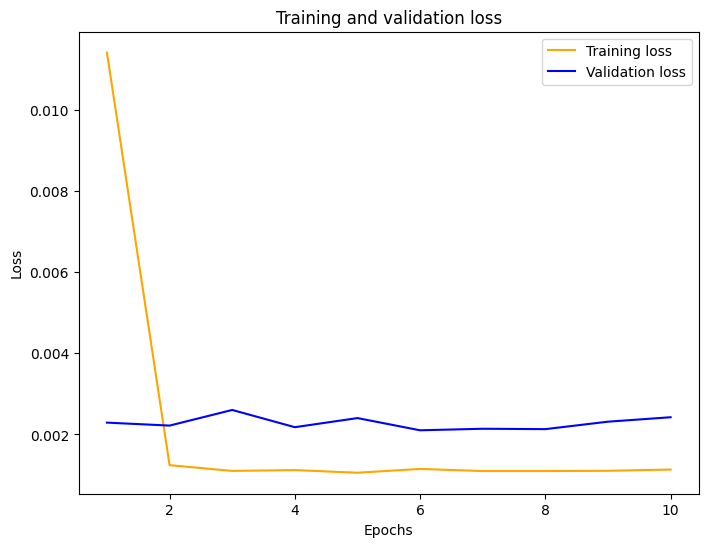

In [47]:
plot_curve(hist_005)

In [48]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.543930,0.529262
1,2021-12-10 15:25:00,0.588,0.534214,0.512269
2,2021-12-10 15:26:00,0.566,0.594849,0.572588
3,2021-12-10 15:27:00,0.562,0.563980,0.540626
4,2021-12-10 15:28:00,0.612,0.558066,0.540568
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172794,0.157134
3009,2021-12-16 13:59:00,0.169,0.173644,0.157468
3010,2021-12-16 14:00:00,0.147,0.174848,0.158869
3011,2021-12-16 14:01:00,0.145,0.145481,0.133739


In [49]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [50]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
lstm_rmse_error4 = mean_squared_error(test2["cloud_cover"], test2["LSTM_005"], squared=False)
lstm_mae_error4 = mae(test2["cloud_cover"], test2["LSTM_005"])
lstm_mape_error4 = mape(test2['cloud_cover'], test2['LSTM_005'])

error(lstm_mse_error_unit_50_005,lstm_rmse_error4,lstm_mae_error4,lstm_mape_error4)

[{'MSE': 0.002411511517787614,
  'RMSE': 0.049107143246045315,
  'MAE': 0.028633689178940228,
  'MAPE': 0.09905539213366436}]

In [51]:
compare_model(lstm_mape_error,lstm_mape_error4)

Better MSE value is :  0.08601468433417768


,Model,MSE error
0,model,0.086015
1,model_1,0.099055


In [52]:
data4 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error4, 'MAPE error' : lstm_mape_error4,'MSE error':lstm_mse_error_unit_50_005, 'RMSE error':lstm_rmse_error4}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\1922675618.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [53]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 7s 12ms/step - loss: 0.0063 - val_loss: 0.0024
Epoch 2/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 3/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 3s 8ms/step - loss: 9.8921e-04 - val_loss: 0.0021
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 3s 7ms/step - loss: 9.9683e-04 - val_los

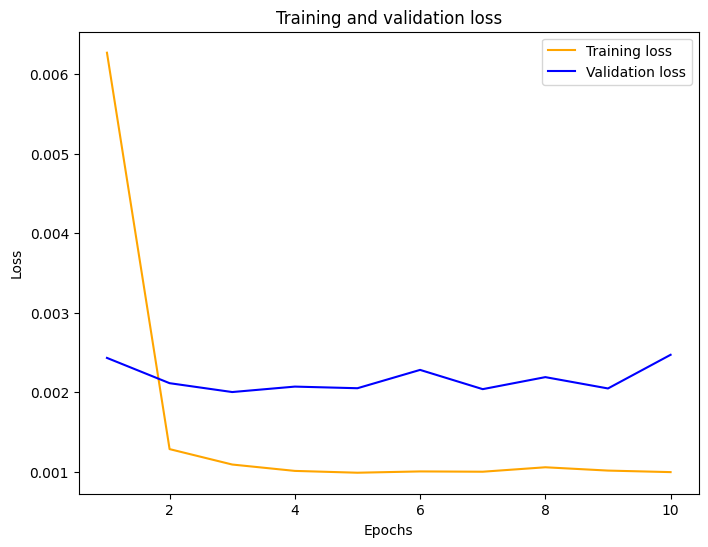

In [54]:
plot_curve(hist_001)

In [55]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-10 15:24:00,0.538,0.543930,0.529262,0.539864
1,2021-12-10 15:25:00,0.588,0.534214,0.512269,0.518579
2,2021-12-10 15:26:00,0.566,0.594849,0.572588,0.571587
3,2021-12-10 15:27:00,0.562,0.563980,0.540626,0.533955
4,2021-12-10 15:28:00,0.612,0.558066,0.540568,0.540396
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172794,0.157134,0.154991
3009,2021-12-16 13:59:00,0.169,0.173644,0.157468,0.155294
3010,2021-12-16 14:00:00,0.147,0.174848,0.158869,0.156078
3011,2021-12-16 14:01:00,0.145,0.145481,0.133739,0.134415


In [56]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [57]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
lstm_rmse_error5 = mean_squared_error(test2["cloud_cover"], test2["LSTM_001"], squared=False)
lstm_mae_error5 = mae(test2["cloud_cover"], test2["LSTM_001"])
lstm_mape_error5 = mape(test2['cloud_cover'], test2['LSTM_001'])
error(lstm_mse_error_001,lstm_rmse_error5,lstm_mae_error5,lstm_mape_error5)

[{'MSE': 0.002459052522577525,
  'RMSE': 0.049588834656377284,
  'MAE': 0.030748912539392454,
  'MAPE': 0.11199887194952064}]

In [58]:
compare_model(lstm_mape_error,lstm_mape_error5)

Better MSE value is :  0.08601468433417768


,Model,MSE error
0,model,0.086015
1,model_1,0.111999


In [59]:
data5 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error5, 'MAPE error' : lstm_mape_error5,'MSE error':lstm_mse_error_001, 'RMSE error':lstm_rmse_error5}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\2515562656.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [60]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 7s 12ms/step - loss: 0.0061 - val_loss: 0.0030
Epoch 2/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 5/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 9.8363e-04 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 9.7438e-04 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
377/377 [==============================] - 4s 11ms/step - loss: 9.9849e-04 - val_loss: 0.0025
Epoch 10/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0010 - va

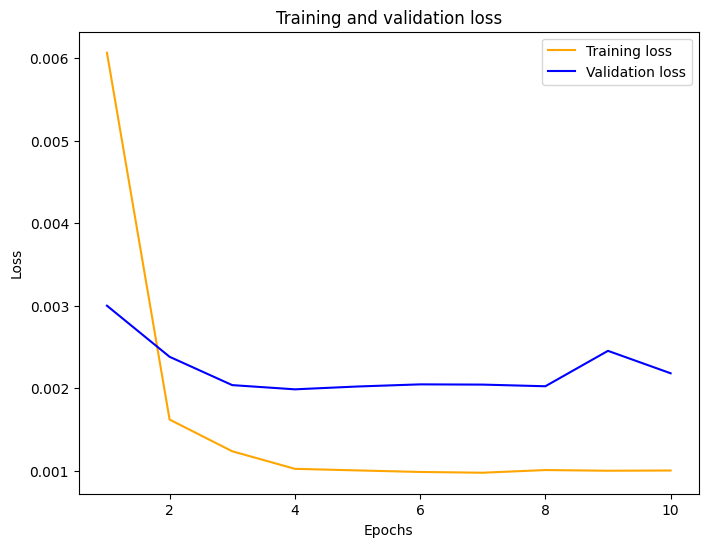

In [61]:
plot_curve(hist_0005)

In [62]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.543930,0.529262,0.539864,0.538852
1,2021-12-10 15:25:00,0.588,0.534214,0.512269,0.518579,0.522333
2,2021-12-10 15:26:00,0.566,0.594849,0.572588,0.571587,0.578102
3,2021-12-10 15:27:00,0.562,0.563980,0.540626,0.533955,0.547926
4,2021-12-10 15:28:00,0.612,0.558066,0.540568,0.540396,0.547367
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172794,0.157134,0.154991,0.166935
3009,2021-12-16 13:59:00,0.169,0.173644,0.157468,0.155294,0.166985
3010,2021-12-16 14:00:00,0.147,0.174848,0.158869,0.156078,0.167986
3011,2021-12-16 14:01:00,0.145,0.145481,0.133739,0.134415,0.146025


In [63]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [64]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
lstm_rmse_error6 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0005"], squared=False)
lstm_mae_error6 = mae(test2["cloud_cover"], test2["LSTM_0005"])
lstm_mape_error6 = mape(test2['cloud_cover'], test2['LSTM_0005'])
error(lstm_mse_error_unit_50_0005,lstm_rmse_error6,lstm_mae_error6,lstm_mape_error6)

[{'MSE': 0.0021687457198825222,
  'RMSE': 0.04656979407172124,
  'MAE': 0.024594118679767622,
  'MAPE': 0.08299275668393497}]

In [65]:
compare_model(lstm_mape_error,lstm_mape_error6)

Better MSE value is :  0.08299275668393497


,Model,MSE error
0,model,0.086015
1,model_1,0.082993


In [66]:
data5 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error6, 'MAPE error' : lstm_mape_error6,'MSE error':lstm_mse_error_unit_50_0005, 'RMSE error':lstm_rmse_error6}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\1503086988.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,,,,,1,10,0.024594,0.082993,0.002169,0.046570


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [67]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 7s 11ms/step - loss: 0.0110 - val_loss: 0.0043
Epoch 2/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0028 - val_loss: 0.0035
Epoch 3/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0022 - val_loss: 0.0030
Epoch 4/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0018 - val_loss: 0.0027
Epoch 5/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.00

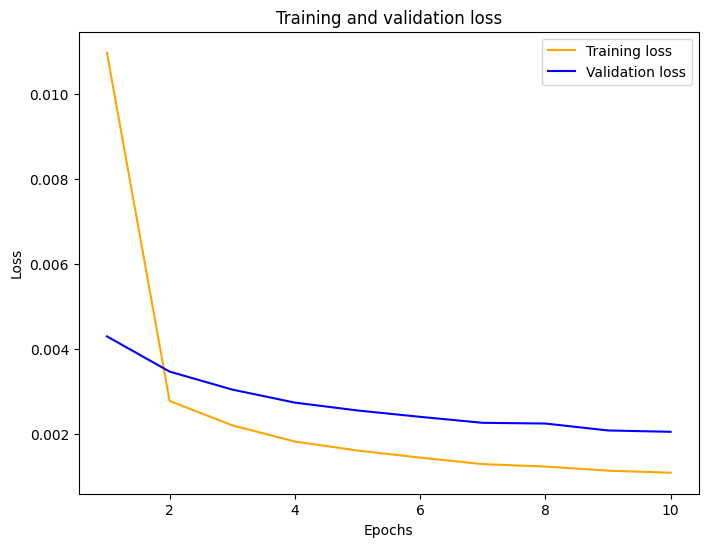

In [68]:
plot_curve(hist_0001)

In [69]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 0s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.543930,0.529262,0.539864,0.538852,0.539864
1,2021-12-10 15:25:00,0.588,0.534214,0.512269,0.518579,0.522333,0.518579
2,2021-12-10 15:26:00,0.566,0.594849,0.572588,0.571587,0.578102,0.571587
3,2021-12-10 15:27:00,0.562,0.563980,0.540626,0.533955,0.547926,0.533955
4,2021-12-10 15:28:00,0.612,0.558066,0.540568,0.540396,0.547367,0.540396
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172794,0.157134,0.154991,0.166935,0.154991
3009,2021-12-16 13:59:00,0.169,0.173644,0.157468,0.155294,0.166985,0.155294
3010,2021-12-16 14:00:00,0.147,0.174848,0.158869,0.156078,0.167986,0.156078
3011,2021-12-16 14:01:00,0.145,0.145481,0.133739,0.134415,0.146025,0.134415


In [70]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [71]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
lstm_rmse_error7 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0001"], squared=False)
lstm_mae_error7 = mae(test2["cloud_cover"], test2["LSTM_0001"])
lstm_mape_error7 = mape(test2['cloud_cover'], test2['LSTM_0001'])
error(lstm_mse_error_0001,lstm_rmse_error7,lstm_mae_error7,lstm_mape_error7)


[{'MSE': 0.002459052522577525,
  'RMSE': 0.049588834656377284,
  'MAE': 0.030748912539392454,
  'MAPE': 0.11199887194952064}]

In [72]:
compare_model(lstm_mape_error6,lstm_mape_error7)

Better MSE value is :  0.08299275668393497


,Model,MSE error
0,model,0.082993
1,model_1,0.111999


In [73]:
data6 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error7, 'MAPE error' : lstm_mape_error7,'MSE error':lstm_mse_error_0001, 'RMSE error':lstm_rmse_error7}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\2597430196.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,,,,,1,10,0.024594,0.082993,0.002169,0.046570
7,15,Adam,32,0.001,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [75]:
test3 = test.copy()

In [76]:
test3['LSTM_50'] = predict_0005

In [77]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 9s 14ms/step - loss: 0.0042 - val_loss: 0.0031
Epoch 2/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 3/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 4/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 5/10
377/377 [==============================] - 4s 10ms/step - loss: 9.9911e-04 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 4s 10ms/step - loss: 9.9526e-04 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 4s 10ms/step - loss: 9.9669e-04 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0

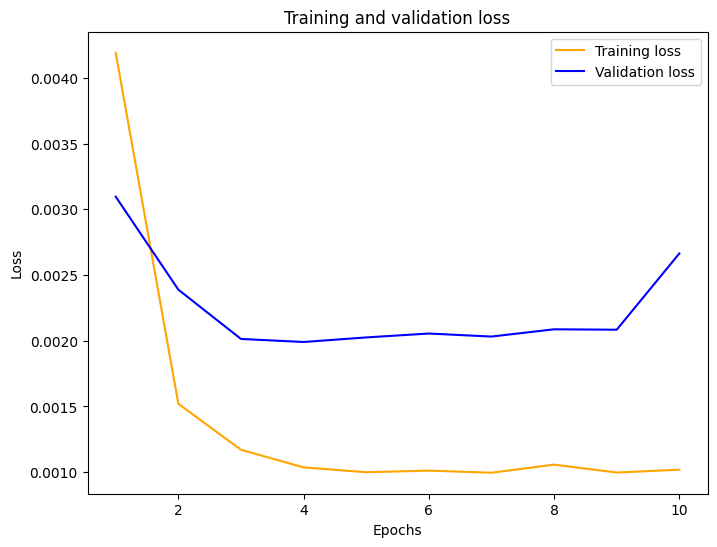

In [78]:
plot_curve(hist_1)

In [79]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.538852,0.523807
1,2021-12-10 15:25:00,0.588,0.522333,0.506134
2,2021-12-10 15:26:00,0.566,0.578102,0.559381
3,2021-12-10 15:27:00,0.562,0.547926,0.531851
4,2021-12-10 15:28:00,0.612,0.547367,0.532076
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166935,0.152987
3009,2021-12-16 13:59:00,0.169,0.166985,0.153115
3010,2021-12-16 14:00:00,0.147,0.167986,0.154032
3011,2021-12-16 14:01:00,0.145,0.146025,0.132478


In [80]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [81]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
lstm_rmse_error8 = mean_squared_error(test3["cloud_cover"], test3["LSTM_100"], squared=False)
lstm_mae_error8 = mae(test3["cloud_cover"], test3["LSTM_100"])
lstm_mape_error8 = mape(test3['cloud_cover'], test3['LSTM_100'])
error(lstm_mse_error_unit_100,lstm_rmse_error8,lstm_mae_error8,lstm_mape_error8)

[{'MSE': 0.002651328014113772,
  'RMSE': 0.05149104790265752,
  'MAE': 0.033338193815299816,
  'MAPE': 0.12205390558352545}]

In [82]:
compare_model(lstm_mape_error6,lstm_mape_error8)

Better MSE value is :  0.08299275668393497


,Model,MSE error
0,model,0.082993
1,model_1,0.122054


In [83]:
data7 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error8, 'MAPE error' : lstm_mape_error8,'MSE error':lstm_mse_error_unit_100, 'RMSE error':lstm_rmse_error8}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\819657541.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,,,,,1,10,0.024594,0.082993,0.002169,0.046570
7,15,Adam,32,0.001,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
8,15,Adam,32,0.005,100,,,,,1,10,0.033338,0.122054,0.002651,0.051491


------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [84]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 11ms/step - loss: 0.0065 - val_loss: 0.0042
Epoch 2/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 3/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0020 - val_loss: 0.0028
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0018 - val_loss: 0.0024
Epoch 5/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0015 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 9/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0014 - val_loss: 0.002

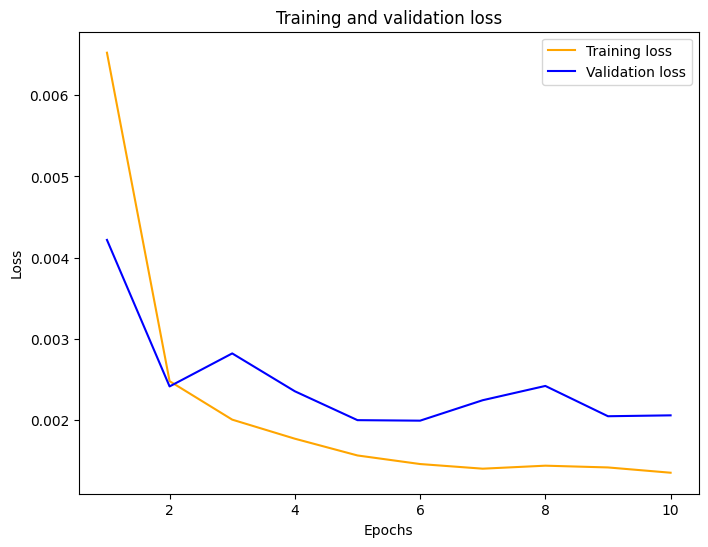

In [85]:
plot_curve(hist_2)

In [86]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.538852,0.523807,0.559238
1,2021-12-10 15:25:00,0.588,0.522333,0.506134,0.543395
2,2021-12-10 15:26:00,0.566,0.578102,0.559381,0.594285
3,2021-12-10 15:27:00,0.562,0.547926,0.531851,0.571482
4,2021-12-10 15:28:00,0.612,0.547367,0.532076,0.565752
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166935,0.152987,0.166610
3009,2021-12-16 13:59:00,0.169,0.166985,0.153115,0.166254
3010,2021-12-16 14:00:00,0.147,0.167986,0.154032,0.167159
3011,2021-12-16 14:01:00,0.145,0.146025,0.132478,0.147017


In [87]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [88]:
lstm_mse_error_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
lstm_rmse_error9 = mean_squared_error(test3["cloud_cover"], test3["LSTM_Drop_out"], squared=False)
lstm_mae_error9 = mae(test3["cloud_cover"], test3["LSTM_Drop_out"])
lstm_mape_error9 = mape(test3['cloud_cover'], test3['LSTM_Drop_out'])
error(lstm_mse_error_drop_out,lstm_rmse_error9,lstm_mae_error9,lstm_mape_error9)

[{'MSE': 0.0020473992979747947,
  'RMSE': 0.0452481966267695,
  'MAE': 0.0208818110526795,
  'MAPE': 0.08104511741146185}]

In [89]:
compare_model(lstm_mape_error6,lstm_mape_error9)

Better MSE value is :  0.08104511741146185


,Model,MSE error
0,model,0.082993
1,model_1,0.081045


In [90]:
data8 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':0.1, 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error9, 'MAPE error' : lstm_mape_error9,'MSE error':lstm_mse_error_drop_out, 'RMSE error':lstm_rmse_error9}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\3808250239.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,,,,,1,10,0.024594,0.082993,0.002169,0.046570
7,15,Adam,32,0.001,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
8,15,Adam,32,0.005,100,,,,,1,10,0.033338,0.122054,0.002651,0.051491
9,15,Adam,32,0.005,50,0.1,,,,1,10,0.020882,0.081045,0.002047,0.045248


------------------------------------

### Add frist layer: units = 50 and Add Dropout = 0.2

In [105]:
model_7 = Sequential()
model_7.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_7.add(Dropout(0.2))
model_7.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_7.compile(optimizer = opt, loss = 'mean_squared_error')
hist_7 = model_7.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 9s 12ms/step - loss: 0.0064 - val_loss: 0.0033
Epoch 2/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 3/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0019 - val_loss: 0.0025
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0017 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0017 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0018 - val_loss: 0.

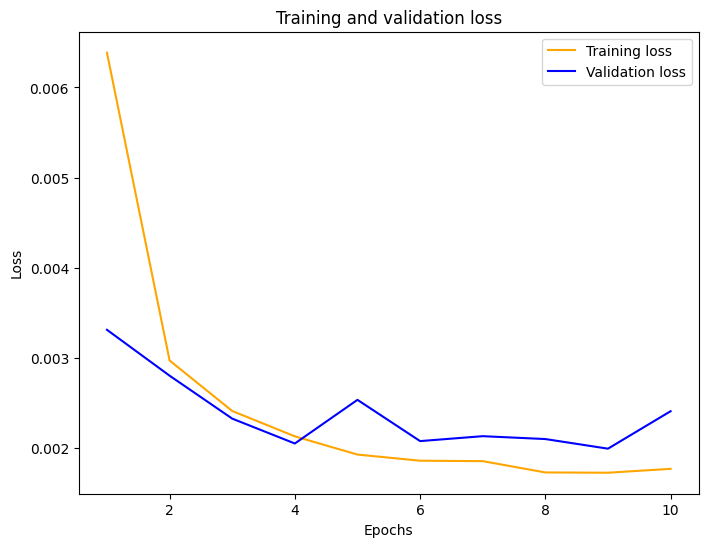

In [106]:
plot_curve(hist_7)

In [107]:
predict_scaled_7 = model_7.predict(X_test)
predict_7 = sc.inverse_transform(predict_scaled_7)
test3['LSTM_Drop_out02'] = predict_7
test3

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_Drop_out02
0,2021-12-10 15:24:00,0.538,0.538852,0.523807,0.559238,0.556784,0.514939,0.527852
1,2021-12-10 15:25:00,0.588,0.522333,0.506134,0.543395,0.535539,0.499889,0.512362
2,2021-12-10 15:26:00,0.566,0.578102,0.559381,0.594285,0.599850,0.553643,0.561966
3,2021-12-10 15:27:00,0.562,0.547926,0.531851,0.571482,0.563225,0.531020,0.540900
4,2021-12-10 15:28:00,0.612,0.547367,0.532076,0.565752,0.566624,0.525295,0.536345
...,...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166935,0.152987,0.166610,0.169352,0.140840,0.156987
3009,2021-12-16 13:59:00,0.169,0.166985,0.153115,0.166254,0.169338,0.140702,0.156816
3010,2021-12-16 14:00:00,0.147,0.167986,0.154032,0.167159,0.170467,0.141783,0.157749
3011,2021-12-16 14:01:00,0.145,0.146025,0.132478,0.147017,0.146783,0.119544,0.137654


In [108]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out02'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [109]:
lstm_mse_error_drop_out02 = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out02'], squared=True)
lstm_rmse_error14 = mean_squared_error(test3["cloud_cover"], test3["LSTM_Drop_out02"], squared=False)
lstm_mae_error14 = mae(test3["cloud_cover"], test3["LSTM_Drop_out02"])
lstm_mape_error14 = mape(test3['cloud_cover'], test3['LSTM_Drop_out02'])
error(lstm_mse_error_drop_out02,lstm_rmse_error14,lstm_mae_error14,lstm_mape_error14)

[{'MSE': 0.0023995172056764835,
  'RMSE': 0.048984867108898884,
  'MAE': 0.029530372797356038,
  'MAPE': 0.10390654642234147}]

In [110]:
compare_model(lstm_mape_error9,lstm_mape_error14)

Better MSE value is :  0.08104511741146185


,Model,MSE error
0,model,0.081045
1,model_1,0.103907


In [111]:
data14 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':0.2, 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error14, 'MAPE error' : lstm_mape_error14,'MSE error':lstm_mse_error_drop_out02, 'RMSE error':lstm_rmse_error14}]

mse_data = mse_data.append(data14,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\205106949.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,,,,,1,10,0.024594,0.082993,0.002169,0.046570
7,15,Adam,32,0.001,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
8,15,Adam,32,0.005,100,,,,,1,10,0.033338,0.122054,0.002651,0.051491
9,15,Adam,32,0.005,50,0.1,,,,1,10,0.020882,0.081045,0.002047,0.045248


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [91]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(Dropout(0.1))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 16s 20ms/step - loss: 0.0050 - val_loss: 0.0028
Epoch 2/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0018 - val_loss: 0.0021
Epoch 3/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0015 - val_loss: 0.0022
Epoch 4/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 5/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0012 - val_l

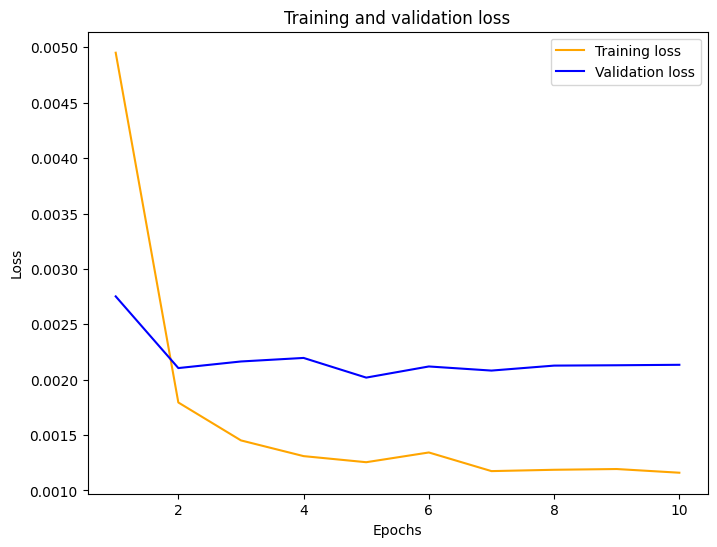

In [92]:
plot_curve(hist_3)

In [93]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 2s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.538852,0.523807,0.559238,0.556784
1,2021-12-10 15:25:00,0.588,0.522333,0.506134,0.543395,0.535539
2,2021-12-10 15:26:00,0.566,0.578102,0.559381,0.594285,0.599850
3,2021-12-10 15:27:00,0.562,0.547926,0.531851,0.571482,0.563225
4,2021-12-10 15:28:00,0.612,0.547367,0.532076,0.565752,0.566624
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166935,0.152987,0.166610,0.169352
3009,2021-12-16 13:59:00,0.169,0.166985,0.153115,0.166254,0.169338
3010,2021-12-16 14:00:00,0.147,0.167986,0.154032,0.167159,0.170467
3011,2021-12-16 14:01:00,0.145,0.146025,0.132478,0.147017,0.146783


In [94]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [95]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
lstm_rmse_error11 = mean_squared_error(test3["cloud_cover"], test3["LSTM_second_layer_50"], squared=False)
lstm_mae_error11 = mae(test3["cloud_cover"], test3["LSTM_second_layer_50"])
lstm_mape_error11 = mape(test3['cloud_cover'], test3['LSTM_second_layer_50'])
error(lstm_mse_error_second_layer,lstm_rmse_error11,lstm_mae_error11,lstm_mape_error11)


[{'MSE': 0.0021238089707505832,
  'RMSE': 0.046084801949781484,
  'MAE': 0.02124024323393197,
  'MAPE': 0.08083129088065069}]

In [96]:
compare_model(lstm_mape_error9,lstm_mape_error11)

Better MSE value is :  0.08083129088065069


,Model,MSE error
0,model,0.081045
1,model_1,0.080831


In [97]:
data10 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':0.1, 'Second layer':50, 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error11, 'MAPE error' : lstm_mape_error11,'MSE error':lstm_mse_error_second_layer, 'RMSE error':lstm_rmse_error11}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\3223542742.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,,,,,1,10,0.024594,0.082993,0.002169,0.046570
7,15,Adam,32,0.001,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
8,15,Adam,32,0.005,100,,,,,1,10,0.033338,0.122054,0.002651,0.051491
9,15,Adam,32,0.005,50,0.1,,,,1,10,0.020882,0.081045,0.002047,0.045248


---

### Add frist layer: units = 50 and Add second layer: unit = 100

In [98]:
model_6 = Sequential()
model_6.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_6.add(Dropout(0.1))
model_6.add(LSTM(units = 100))
model_6.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_6.compile(optimizer = opt, loss = 'mean_squared_error')
hist_6 = model_6.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 14s 21ms/step - loss: 0.0062 - val_loss: 0.0029
Epoch 2/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0019 - val_loss: 0.0022
Epoch 3/10
377/377 [==============================] - 7s 18ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 4/10
377/377 [==============================] - 7s 18ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 5/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0013 - val_loss: 0.0029
Epoch 6/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0014 - val_loss: 0.0035
Epoch 8/10
377/377 [==============================] - 7s 17ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0012 - val_l

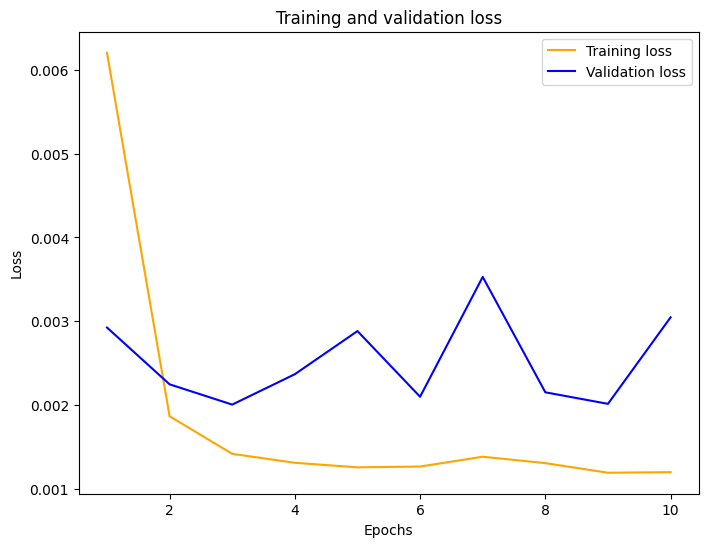

In [99]:
plot_curve(hist_6)

In [100]:
predict_scaled_6 = model_6.predict(X_test)
predict_6 = sc.inverse_transform(predict_scaled_6)
test3['LSTM_second_layer_100'] = predict_6
test3

95/95 [==============================] - 2s 8ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100
0,2021-12-10 15:24:00,0.538,0.538852,0.523807,0.559238,0.556784,0.514939
1,2021-12-10 15:25:00,0.588,0.522333,0.506134,0.543395,0.535539,0.499889
2,2021-12-10 15:26:00,0.566,0.578102,0.559381,0.594285,0.599850,0.553643
3,2021-12-10 15:27:00,0.562,0.547926,0.531851,0.571482,0.563225,0.531020
4,2021-12-10 15:28:00,0.612,0.547367,0.532076,0.565752,0.566624,0.525295
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166935,0.152987,0.166610,0.169352,0.140840
3009,2021-12-16 13:59:00,0.169,0.166985,0.153115,0.166254,0.169338,0.140702
3010,2021-12-16 14:00:00,0.147,0.167986,0.154032,0.167159,0.170467,0.141783
3011,2021-12-16 14:01:00,0.145,0.146025,0.132478,0.147017,0.146783,0.119544


In [101]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [102]:
lstm_mse_error_second_layer100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_100'], squared=True)
lstm_rmse_error13 = mean_squared_error(test3["cloud_cover"], test3["LSTM_second_layer_100"], squared=False)
lstm_mae_error13 = mae(test3["cloud_cover"], test3["LSTM_second_layer_100"])
lstm_mape_error13 = mape(test3['cloud_cover'], test3['LSTM_second_layer_100'])
error(lstm_mse_error_second_layer100,lstm_rmse_error13,lstm_mae_error13,lstm_mape_error13)


[{'MSE': 0.0030318700097665212,
  'RMSE': 0.055062419214619705,
  'MAE': 0.03962117927451576,
  'MAPE': 0.1786911481448706}]

In [103]:
compare_model(lstm_mape_error11,lstm_mape_error13)

Better MSE value is :  0.08083129088065069


,Model,MSE error
0,model,0.080831
1,model_1,0.178691


In [104]:
data10 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':0.1, 'Second layer':100, 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error13, 'MAPE error' : lstm_mape_error13,'MSE error':lstm_mse_error_second_layer100, 'RMSE error':lstm_rmse_error13}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\3413446216.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,,,,,1,10,0.024594,0.082993,0.002169,0.046570
7,15,Adam,32,0.001,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
8,15,Adam,32,0.005,100,,,,,1,10,0.033338,0.122054,0.002651,0.051491
9,15,Adam,32,0.005,50,0.1,,,,1,10,0.020882,0.081045,0.002047,0.045248


---

### Add frist layer: units = 50 and Add second layer: unit = 50 drop

In [112]:
model_8 = Sequential()
model_8.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_8.add(Dropout(0.1))
model_8.add(LSTM(units = 50))
model_8.add(Dropout(0.1))
model_8.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_8.compile(optimizer = opt, loss = 'mean_squared_error')
hist_8 = model_8.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 15s 21ms/step - loss: 0.0077 - val_loss: 0.0032
Epoch 2/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 3/10
377/377 [==============================] - 7s 18ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 4/10
377/377 [==============================] - 7s 17ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0016 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0017 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0016 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0015 - val_loss: 0.0026
Epoch 10/10
377/377 [==============================] - 7s 17ms/step - loss: 0.0016 - val_l

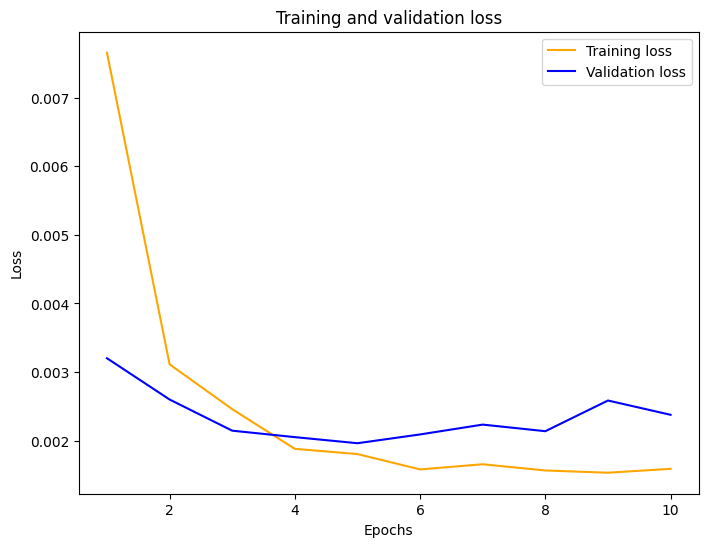

In [113]:
plot_curve(hist_8)

In [114]:
predict_scaled_8 = model_8.predict(X_test)
predict_8 = sc.inverse_transform(predict_scaled_8)
test3['LSTM_second_layer_50drop'] = predict_8
test3

95/95 [==============================] - 2s 7ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_Drop_out02,LSTM_second_layer_50drop
0,2021-12-10 15:24:00,0.538,0.538852,0.523807,0.559238,0.556784,0.514939,0.527852,0.567765
1,2021-12-10 15:25:00,0.588,0.522333,0.506134,0.543395,0.535539,0.499889,0.512362,0.546681
2,2021-12-10 15:26:00,0.566,0.578102,0.559381,0.594285,0.599850,0.553643,0.561966,0.600371
3,2021-12-10 15:27:00,0.562,0.547926,0.531851,0.571482,0.563225,0.531020,0.540900,0.573368
4,2021-12-10 15:28:00,0.612,0.547367,0.532076,0.565752,0.566624,0.525295,0.536345,0.574464
...,...,...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166935,0.152987,0.166610,0.169352,0.140840,0.156987,0.188419
3009,2021-12-16 13:59:00,0.169,0.166985,0.153115,0.166254,0.169338,0.140702,0.156816,0.188590
3010,2021-12-16 14:00:00,0.147,0.167986,0.154032,0.167159,0.170467,0.141783,0.157749,0.189703
3011,2021-12-16 14:01:00,0.145,0.146025,0.132478,0.147017,0.146783,0.119544,0.137654,0.166357


In [115]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50drop'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [116]:
lstm_mse_error_second_layerdrop = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50drop'], squared=True)
lstm_rmse_error15 = mean_squared_error(test3["cloud_cover"], test3["LSTM_second_layer_50drop"], squared=False)
lstm_mae_error15 = mae(test3["cloud_cover"], test3["LSTM_second_layer_50drop"])
lstm_mape_error15 = mape(test3['cloud_cover'], test3['LSTM_second_layer_50drop'])
error(lstm_mse_error_second_layerdrop,lstm_rmse_error15,lstm_mae_error15,lstm_mape_error15)


[{'MSE': 0.0023645557182439495,
  'RMSE': 0.048626697587271436,
  'MAE': 0.029741400112004483,
  'MAPE': 0.18093266525066737}]

In [117]:
compare_model(lstm_mape_error11,lstm_mape_error15)

Better MSE value is :  0.08083129088065069


,Model,MSE error
0,model,0.080831
1,model_1,0.180933


In [118]:
data10 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':0.1, 'Second layer':50, 'Drop out2':0.1,
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error15, 'MAPE error' : lstm_mape_error15,'MSE error':lstm_mse_error_second_layerdrop, 'RMSE error':lstm_rmse_error15}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\3156985530.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,,,,,1,10,0.024594,0.082993,0.002169,0.046570
7,15,Adam,32,0.001,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
8,15,Adam,32,0.005,100,,,,,1,10,0.033338,0.122054,0.002651,0.051491
9,15,Adam,32,0.005,50,0.1,,,,1,10,0.020882,0.081045,0.002047,0.045248


---

### Add frist layer: units = 50 and change epochs from 10 to 20

In [119]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_5.add(Dropout(0.1))
model_5.add(LSTM(units = 50))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
377/377 [==============================] - 20s 28ms/step - loss: 0.0064 - val_loss: 0.0035
Epoch 2/20
377/377 [==============================] - 6s 17ms/step - loss: 0.0020 - val_loss: 0.0026
Epoch 3/20
377/377 [==============================] - 6s 16ms/step - loss: 0.0016 - val_loss: 0.0021
Epoch 4/20
377/377 [==============================] - 6s 17ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 5/20
377/377 [==============================] - 6s 16ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 6/20
377/377 [==============================] - 6s 16ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 7/20
377/377 [==============================] - 7s 17ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 8/20
377/377 [==============================] - 6s 16ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/20
377/377 [==============================] - 6s 16ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 10/20
377/377 [==============================] - 7s 17ms/step - loss: 0.0012 - val_l

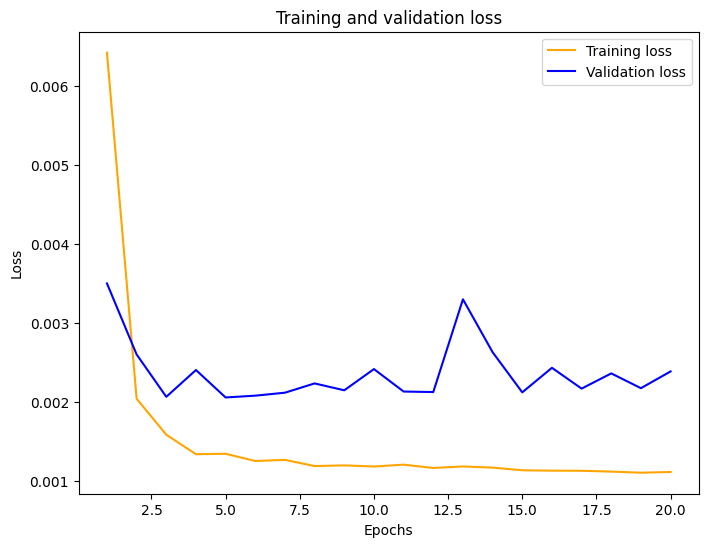

In [120]:
plot_curve(hist_5)

In [121]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 2s 7ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_Drop_out02,LSTM_second_layer_50drop,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.538852,0.523807,0.559238,0.556784,0.514939,0.527852,0.567765,0.528464
1,2021-12-10 15:25:00,0.588,0.522333,0.506134,0.543395,0.535539,0.499889,0.512362,0.546681,0.516444
2,2021-12-10 15:26:00,0.566,0.578102,0.559381,0.594285,0.599850,0.553643,0.561966,0.600371,0.591297
3,2021-12-10 15:27:00,0.562,0.547926,0.531851,0.571482,0.563225,0.531020,0.540900,0.573368,0.554089
4,2021-12-10 15:28:00,0.612,0.547367,0.532076,0.565752,0.566624,0.525295,0.536345,0.574464,0.550232
...,...,...,...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.166935,0.152987,0.166610,0.169352,0.140840,0.156987,0.188419,0.153802
3009,2021-12-16 13:59:00,0.169,0.166985,0.153115,0.166254,0.169338,0.140702,0.156816,0.188590,0.153925
3010,2021-12-16 14:00:00,0.147,0.167986,0.154032,0.167159,0.170467,0.141783,0.157749,0.189703,0.154889
3011,2021-12-16 14:01:00,0.145,0.146025,0.132478,0.147017,0.146783,0.119544,0.137654,0.166357,0.131990


In [122]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [123]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
lstm_rmse_error12 = mean_squared_error(test3["cloud_cover"], test3["LSTM_epoch20"], squared=False)
lstm_mae_error12 = mae(test3["cloud_cover"], test3["LSTM_epoch20"])
lstm_mape_error12 = mape(test3['cloud_cover'], test3['LSTM_epoch20'])
error(lstm_mse_error_unit_50_epoch20,lstm_rmse_error12,lstm_mae_error12,lstm_mape_error12)

[{'MSE': 0.002370941765127038,
  'RMSE': 0.04869231731112248,
  'MAE': 0.025558734483717687,
  'MAPE': 0.10554796115244944}]

In [124]:
compare_model(lstm_mape_error11,lstm_mape_error12)

Better MSE value is :  0.08083129088065069


,Model,MSE error
0,model,0.080831
1,model_1,0.105548


In [125]:
data11 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':0.1, 'Second layer':50, 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':20 , 'MAE error':lstm_mae_error12, 'MAPE error' : lstm_mape_error12,'MSE error':lstm_mse_error_unit_50_epoch20, 'RMSE error':lstm_rmse_error12}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_4380\2688780386.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,,50,,,,,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,,50,,,,,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,,50,,,,,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.1,50,,,,,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.05,50,,,,,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.01,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,,,,,1,10,0.024594,0.082993,0.002169,0.046570
7,15,Adam,32,0.001,50,,,,,1,10,0.030749,0.111999,0.002459,0.049589
8,15,Adam,32,0.005,100,,,,,1,10,0.033338,0.122054,0.002651,0.051491
9,15,Adam,32,0.005,50,0.1,,,,1,10,0.020882,0.081045,0.002047,0.045248


---

# save model

In [ ]:
mse_data = mse_data.round({"MSE error": 6, "MAE error": 6, "MAPE error": 6, "RMSE error": 6})

In [126]:
mse_data.to_csv('data_lstm_mse_lag15.csv',index=False)

In [127]:
lstm = pd.read_csv('data_lstm_mse_lag15.csv')

In [128]:
lstm

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,15,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.021963,0.086015,0.002031,0.045063
1,15,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.023073,0.097727,0.002102,0.045846
2,15,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.026016,0.100981,0.002505,0.050054
3,15,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.023612,0.106149,0.002249,0.047422
4,15,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.028634,0.099055,0.002412,0.049107
5,15,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.030749,0.111999,0.002459,0.049589
6,15,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.024594,0.082993,0.002169,0.046570
7,15,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.030749,0.111999,0.002459,0.049589
8,15,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.033338,0.122054,0.002651,0.051491
9,15,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.020882,0.081045,0.002047,0.045248


# error

In [129]:
error = lstm.groupby(['Lags'])[['MAE error','MAPE error','MSE error','RMSE error']].transform(min) == lstm[['MAE error','MAPE error','MSE error','RMSE error']]
lstm[error]

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002031,0.045063
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.020882,NaN,NaN,NaN


In [130]:
model_3.save('model_train_80%_lag15.h5')